Project Steps:

* Camera calibration
* Distortion correction
* Color/gradient threshold
* Perspective transform

After doing these steps, you’ll be given two additional steps for the project:

* Detect lane lines
* Determine the lane curvature

### Camera calibration and distortion correction on the calibration images

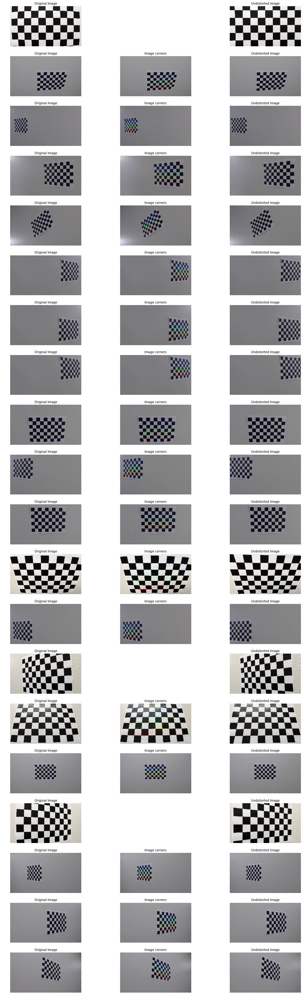

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

%matplotlib inline

# prepare object points
nx = 9 # number of inside corners in x
ny = 6 # number of inside corners in y

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')


# arrays to store object points and image points from all the image
objpoints = []
imgpoints = []

# prepare object points
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

fig, ax = plt.subplots(len(images), 3, figsize=(15, 45))
fig.tight_layout()

img_counter=0
for fname in images:
    img = mpimg.imread(fname)
    ax[img_counter,0].imshow(img)
    ax[img_counter,0].set_title('Original Image', fontsize=10)
    ax[img_counter,0].axis('off')
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    ax[img_counter,1].axis('off')
    # If found, draw corners
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        ax[img_counter,1].imshow(img)
        ax[img_counter,1].set_title('Image corners', fontsize=10)
    img_counter += 1
    
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

img_counter=0
for fname in images:
    img = mpimg.imread(fname)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    ax[img_counter,2].imshow(dst)
    ax[img_counter,2].set_title('Undistorted Image', fontsize=10)
    ax[img_counter,2].axis('off')
    img_counter += 1


### Distortion correction on the test images

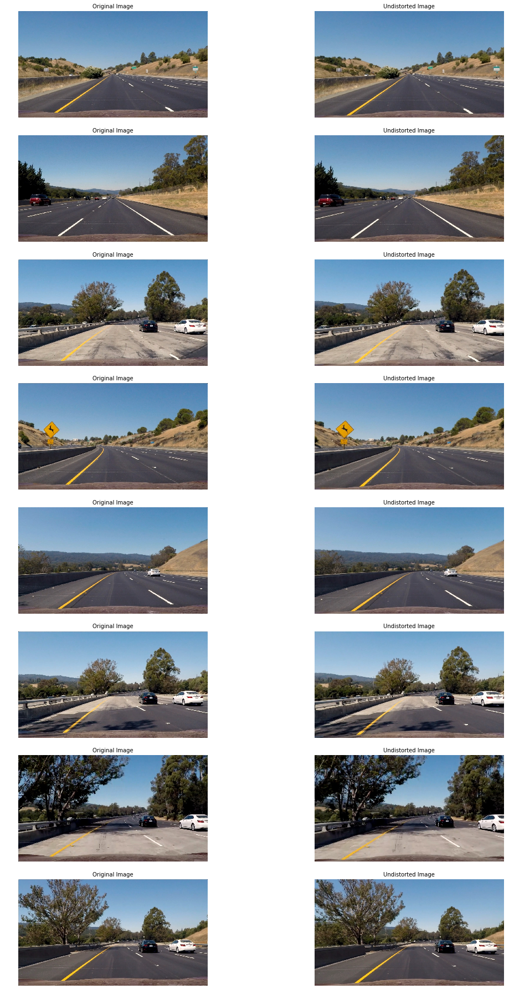

In [2]:
import os

# Open a file
path = "test_images"
dirs = os.listdir( path )

undst_img = []

fig, ax = plt.subplots(len(dirs), 2, figsize=(15, 25))
fig.tight_layout()

img_counter = 0
for image in dirs:
    img = mpimg.imread(path+"/"+image)
    ax[img_counter,0].imshow(img)
    ax[img_counter,0].set_title('Original Image', fontsize=10)
    ax[img_counter,0].axis('off')
    undst_img.append(cv2.undistort(img, mtx, dist, None, mtx))
    ax[img_counter,1].imshow(undst_img[img_counter])
    ax[img_counter,1].set_title('Undistorted Image', fontsize=10)
    ax[img_counter,1].axis('off')
    img_counter += 1
    

Functions for different gradient calculation methods

In [3]:
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient=="x":
        xVal=1
        yVal=0
    if orient=="y":
        xVal=0
        yVal=1
    sobelx = cv2.Sobel(gray, cv2.CV_64F, xVal, yVal)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobelx = np.absolute(sobelx)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    binary_output = sxbinary # Remove this line
    
    return binary_output
    

In [4]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Calculate the magnitude 
    abs_sobel = np.sqrt(np.power(sobelx,2) + np.power(sobely,2))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a binary mask where mag thresholds are met
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    binary_output = sxbinary
    
    return binary_output


In [5]:
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    cv2.getDerivKernels(1, 0, 5)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    cv2.getDerivKernels(0, 1, 5)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel) 
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    scaled_sobel = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    binary_output = sxbinary # Remove this line

    return binary_output
    

Test different gradient calculation

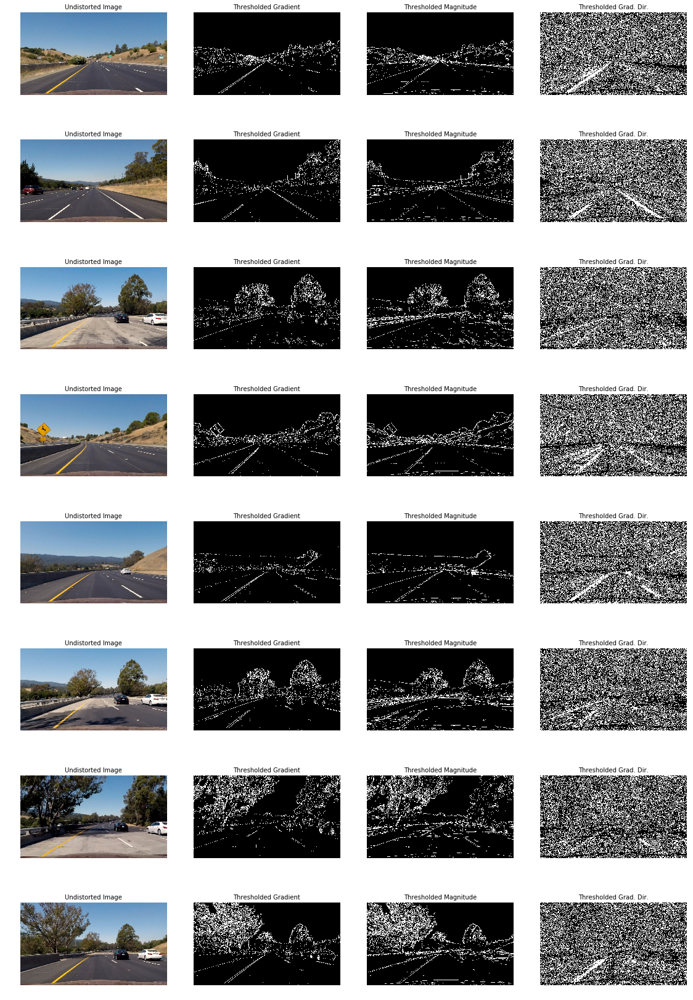

In [6]:
-

Test combination of calculated gradients

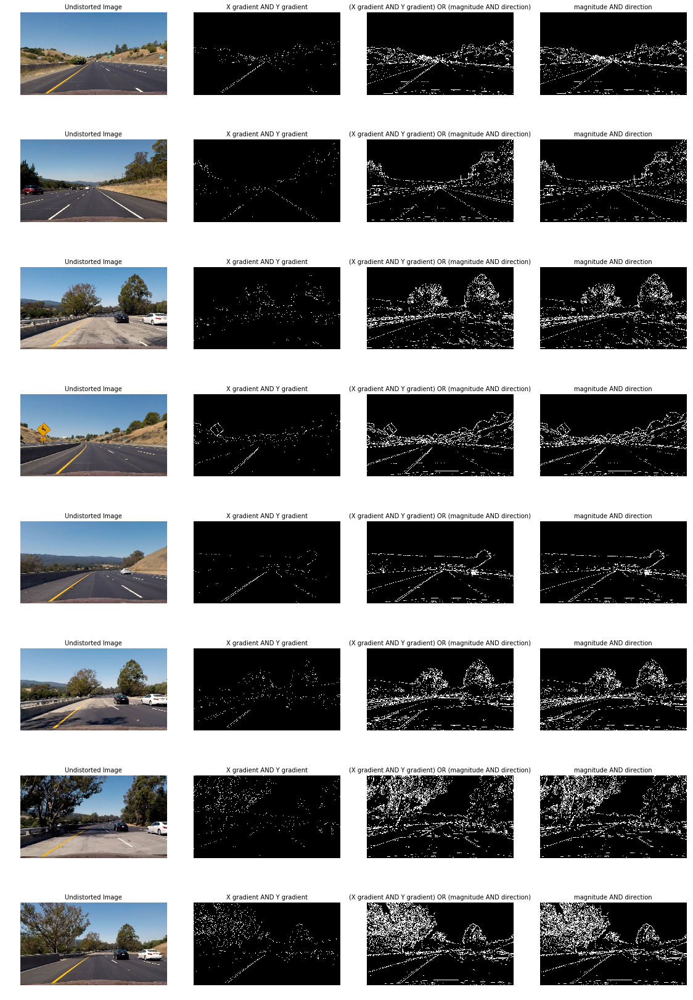

In [7]:
image = undst_img[0]

ksize = 3 # Choose a larger odd number to smooth gradient measurements

#Try different combinations and see what you get.
#For example, here is a selection for pixels where both the x and y gradients meet the threshold criteria, or the gradient magnitude and direction are both within their threshold values.

fig, ax = plt.subplots(len(undst_img), 4, figsize=(15, 25))
fig.tight_layout()

img_counter = 0
for img in undst_img:
    
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(30, 100))
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(30, 100))
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(30, 100))
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0, np.pi/2))

    ax[img_counter,0].imshow(img)
    ax[img_counter,0].set_title('Undistorted Image', fontsize=10)
    ax[img_counter,0].axis('off')
    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1))] = 1
    
    ax[img_counter,1].imshow(combined, cmap='gray')
    ax[img_counter,1].set_title('X gradient AND Y gradient', fontsize=10)
    ax[img_counter,1].axis('off')
    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    ax[img_counter,2].imshow(combined, cmap='gray')
    ax[img_counter,2].set_title('(X gradient AND Y gradient) OR (magnitude AND direction)', fontsize=10)
    ax[img_counter,2].axis('off')
    
    combined = np.zeros_like(dir_binary)
    combined[((mag_binary == 1) & (dir_binary == 1))] = 1
    
    ax[img_counter,3].imshow(combined, cmap='gray')
    ax[img_counter,3].set_title('magnitude AND direction', fontsize=10)
    ax[img_counter,3].axis('off')
    
    img_counter += 1
    
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


Check image components on RGB and HLS color spaces

(-0.5, 1279.5, 719.5, -0.5)

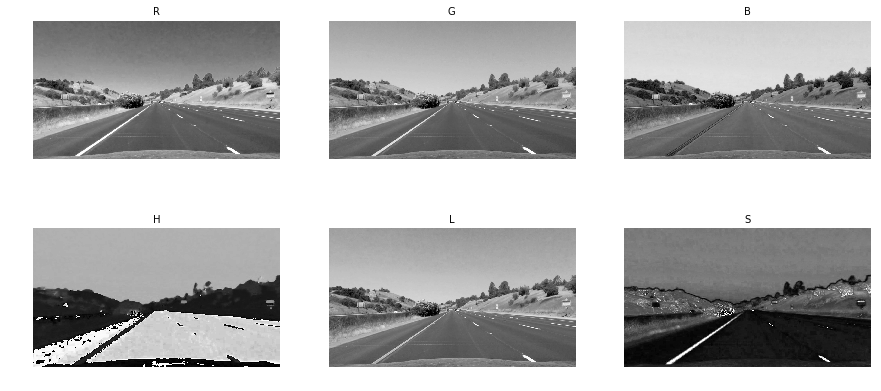

In [8]:
img_id = 0

# separate RGB color components
R = undst_img[img_id][:,:,0]
G = undst_img[img_id][:,:,1]
B = undst_img[img_id][:,:,2]

# separate HLS color components
hls = cv2.cvtColor(undst_img[img_id], cv2.COLOR_RGB2HLS)
H = hls[:,:,0]
L = hls[:,:,1]
S = hls[:,:,2] 

# display RGB and HLS
fig, ax = plt.subplots(2, 3, figsize=(15, 7))
#fig.tight_layout()

ax[0,0].imshow(image[:,:,0], cmap="Greys_r")
ax[0,0].set_title('R', fontsize=10)
ax[0,0].axis('off')

ax[0,1].imshow(image[:,:,1], cmap="Greys_r")
ax[0,1].set_title('G', fontsize=10)
ax[0,1].axis('off')

ax[0,2].imshow(image[:,:,2], cmap="Greys_r")
ax[0,2].set_title('B', fontsize=10)
ax[0,2].axis('off')

ax[1,0].imshow(hls[:,:,0], cmap="Greys_r")
ax[1,0].set_title('H', fontsize=10)
ax[1,0].axis('off')

ax[1,1].imshow(hls[:,:,1], cmap="Greys_r")
ax[1,1].set_title('L', fontsize=10)
ax[1,1].axis('off')

ax[1,2].imshow(hls[:,:,2], cmap="Greys_r")
ax[1,2].set_title('S', fontsize=10)
ax[1,2].axis('off')



Calculate threshold binaries for Grayscale, R, S and H

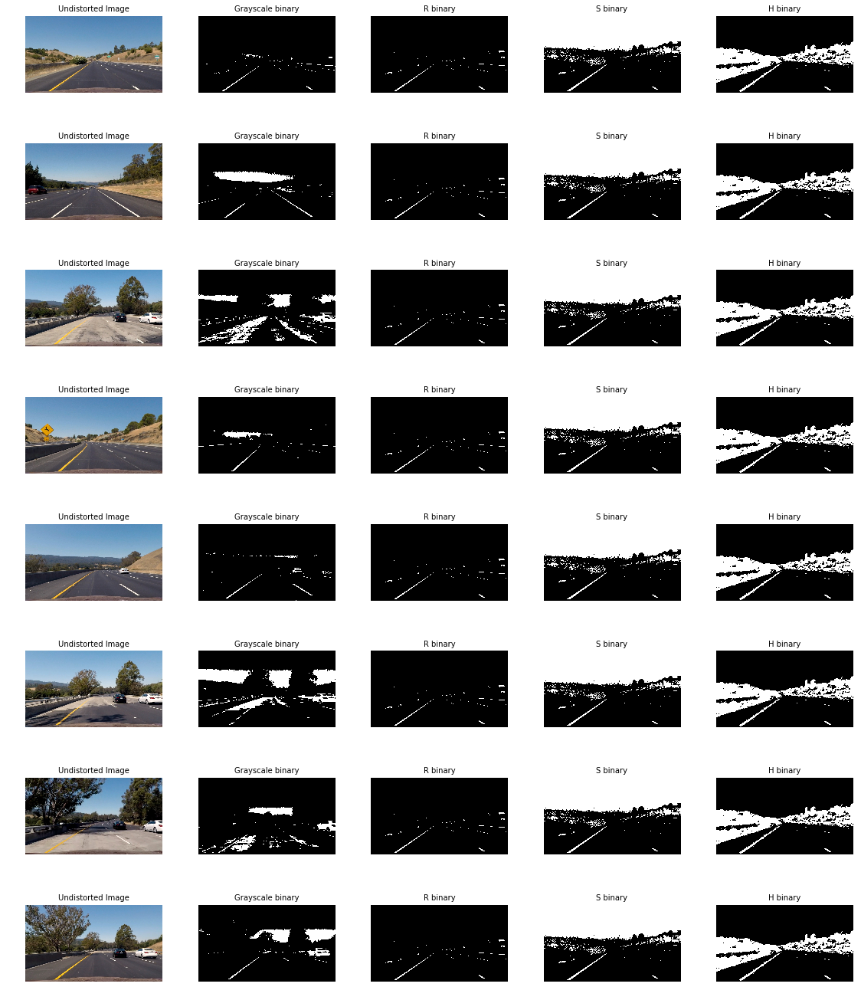

In [9]:

# display threshold binaries for Grayscale, R, S and H

fig, ax = plt.subplots(len(undst_img), 5, figsize=(15, 20))
fig.tight_layout()

img_counter = 0
for img in undst_img:
    
    # calculate threshold binaries for Grayscale, R, S and H
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    thresh = (180, 255)
    binary = np.zeros_like(gray)
    binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1
    GSbinary = binary

    thresh = (200, 255)
    binary = np.zeros_like(img[:,:,0]) # R
    binary[(R > thresh[0]) & (R <= thresh[1])] = 1
    Rbinary = binary 

    thresh = (90, 255)
    binary = np.zeros_like(hls[:,:,2]) # S
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    Sbinary = binary

    thresh = (15, 100)
    binary = np.zeros_like(hls[:,:,0]) # H
    binary[(H > thresh[0]) & (H <= thresh[1])] = 1
    Hbinary = binary

    ax[img_counter,0].imshow(img)
    ax[img_counter,0].set_title('Undistorted Image', fontsize=10)
    ax[img_counter,0].axis('off')
    
    ax[img_counter,1].imshow(GSbinary, cmap='gray')
    ax[img_counter,1].set_title('Grayscale binary', fontsize=10)
    ax[img_counter,1].axis('off')
    
    ax[img_counter,2].imshow(Rbinary, cmap='gray')
    ax[img_counter,2].set_title('R binary', fontsize=10)
    ax[img_counter,2].axis('off')
    
    ax[img_counter,3].imshow(Sbinary, cmap='gray')
    ax[img_counter,3].set_title('S binary', fontsize=10)
    ax[img_counter,3].axis('off')
    
    ax[img_counter,4].imshow(Hbinary, cmap='gray')
    ax[img_counter,4].set_title('H binary', fontsize=10)
    ax[img_counter,4].axis('off')
    
    img_counter += 1
    
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Function that thresholds the S-channel of HLS

In [10]:
# Define a function that thresholds the S-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_select(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    S = hls[:,:,2]
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    binary_output = binary # placeholder line

    return binary_output


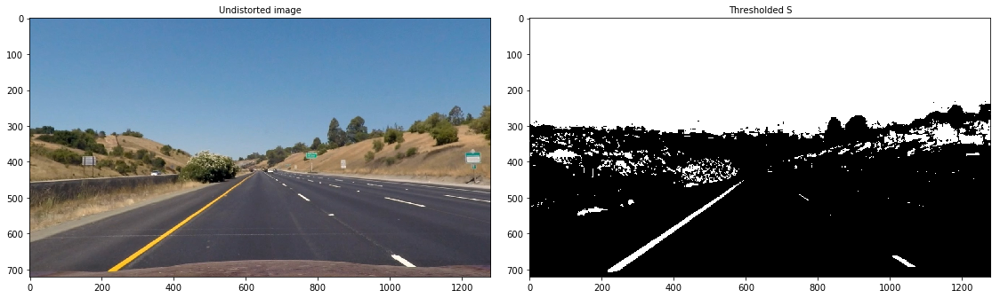

In [11]:
    
img_id = 0
hls_binary = hls_select(undst_img[img_id], thresh=(90, 255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
f.tight_layout()
ax1.imshow(undst_img[img_id])
ax1.set_title('Undistorted image', fontsize=10)
ax2.imshow(hls_binary, cmap='gray')
ax2.set_title('Thresholded S', fontsize=10)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Stacked tresholded X gradient with thresholded S channel from hls color space

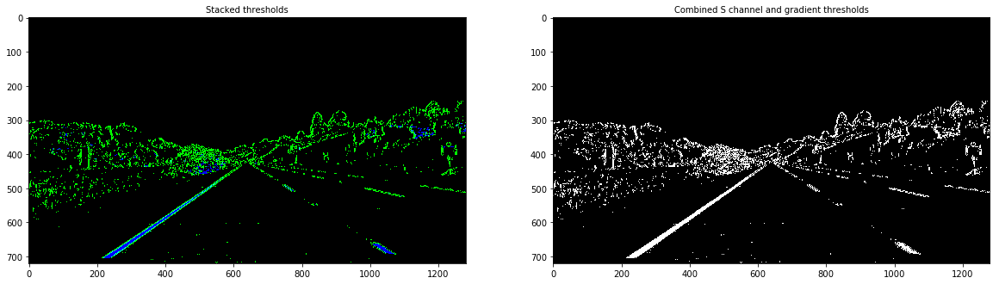

In [12]:
img_id = 0

# Convert to HLS color space and separate the S channel
# Note: img is the undistorted image
hls = cv2.cvtColor(undst_img[img_id], cv2.COLOR_RGB2HLS)
s_channel = hls[:,:,2]

# Grayscale image
# NOTE: we already saw that standard grayscaling lost color information for the lane lines
# Explore gradients in other colors spaces / color channels to see what might work better
gray = cv2.cvtColor(undst_img[img_id], cv2.COLOR_RGB2GRAY)

# Sobel x over grayscale
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

# Threshold x gradient
thresh_min = 20
thresh_max = 100
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

# Threshold color channel
s_thresh_min = 170
s_thresh_max = 255
s_binary = np.zeros_like(s_channel)
s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

# Stack each channel to view their individual contributions in green and blue respectively
# This returns a stack of the two binary images, whose components you can see as different colors
color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

# Combine the two binary thresholds
combined_binary = np.zeros_like(sxbinary)
combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds', fontsize=10)
ax1.imshow(color_binary)

ax2.set_title('Combined S channel and gradient thresholds', fontsize=10)
ax2.imshow(combined_binary, cmap='gray')

Function to stack sobel x over l channel from hls with s channel thresholded gradients

In [13]:
# Edit this function to create your own pipeline.
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    return combined_binary #color_binary
    


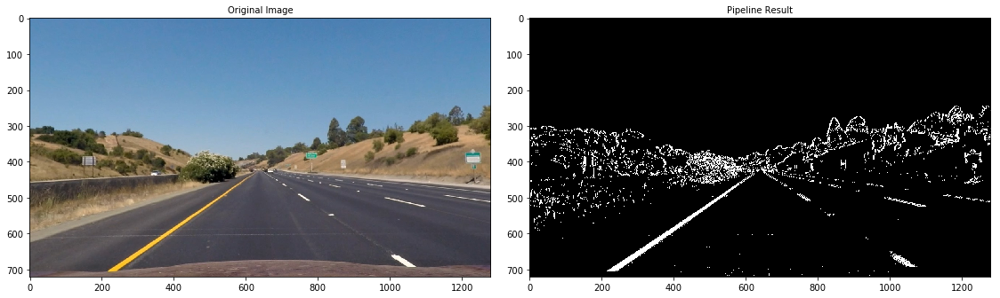

In [14]:

img_id = 0
result = pipeline(undst_img[img_id])

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
f.tight_layout()

ax1.imshow(undst_img[img_id])
ax1.set_title('Original Image', fontsize=10)

ax2.imshow(result,cmap="Greys_r")
ax2.set_title('Pipeline Result', fontsize=10)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Function to mask unwanted information from image

In [15]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    
    return masked_image


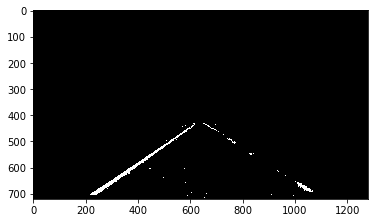

In [16]:
image = result
ysize = image.shape[0]
xsize = image.shape[1]
left_bottom = [0, ysize]
right_bottom = [xsize, ysize]
#apex = [xsize/2, 3*ysize/5]
left_top = [xsize/2-50, 3*ysize/5]
right_top = [xsize/2+50, 3*ysize/5]
polygon = np.array([ left_bottom, right_bottom, right_top, left_top ], np.int32)
masked_img = region_of_interest(image, [polygon])

plt.imshow(masked_img, cmap="gray")
plt.show()

### identify points to prepare image warp

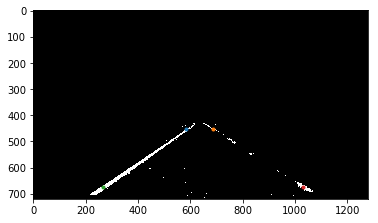

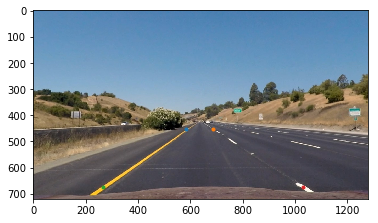

In [17]:
#fname = "test_images/straight_lines1.jpg"
#img = mpimg.imread(fname)
img_id = 0
plt.imshow(masked_img, cmap="gray")
plt.plot(585,451, '.')
plt.plot(685,451, '.')
plt.plot(267,673, '.')
plt.plot(1030,673, '.')
plt.show()
plt.imshow(undst_img[img_id])
plt.plot(585,451, '.')
plt.plot(685,451, '.')
plt.plot(267,673, '.')
plt.plot(1030,673, '.')
plt.show()


### Function to create bird view of the lane

In [18]:
def warp(img):
    img_l = img.shape[0]
    img_c = img.shape[1]
    img_size_lc = (img_l, img_c)
    img_size_cl = (img_c, img_l)
    
    # four source coordinates
    src = np.float32(
        [[585, 451],
         [685, 451],
         [267, 673],
         [1030, 673]])
    
    # four desired coordinates
    dst = np.float32(
        [[0+200, 0],
         [img_c-300, 0],
         [0+200, img_l],
         [img_c-300, img_l]])
    
    # compute the perspective transform
    M = cv2.getPerspectiveTransform(src,dst)
    
    # Could compute the inverse also by swapping the input parameters
    Minv = cv2.getPerspectiveTransform(dst,src)
    
    # create the warped image - uses linear interpolation
    warped = cv2.warpPerspective(img, M, img_size_cl, flags=cv2.INTER_LINEAR)
    unwarped = cv2.warpPerspective(img, Minv, img_size_cl, flags=cv2.INTER_LINEAR)
    
    return warped, unwarped


(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)
(720, 1280, 3)


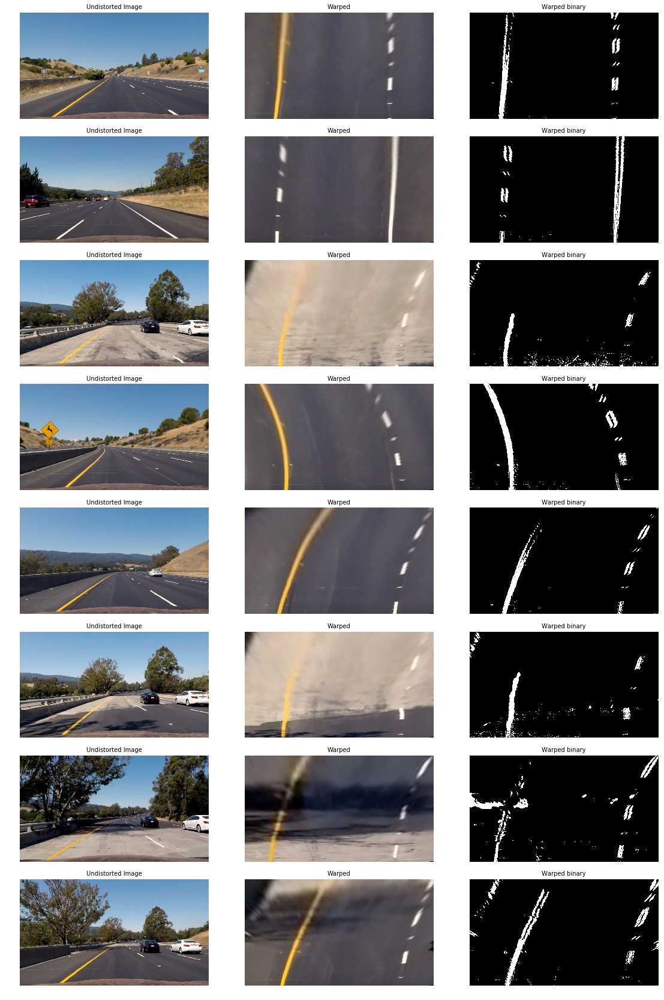

In [86]:
bird_eye = []

fig, ax = plt.subplots(len(undst_img), 3, figsize=(15, 25))
fig.tight_layout()

img_counter = 0
for img in undst_img:
    ax[img_counter,0].imshow(img)
    ax[img_counter,0].set_title('Undistorted Image', fontsize=10)
    ax[img_counter,0].axis('off')
    
    warped_img, unwarped_img = warp(img)
    bird_eye.append(warped_img)
    ax[img_counter,1].imshow(warped_img)
    ax[img_counter,1].set_title('Warped', fontsize=10)
    ax[img_counter,1].axis('off')
    print(warped_img.shape)
    ax[img_counter,2].imshow(pipeline(warped_img), cmap='gray')
    ax[img_counter,2].set_title('Warped binary', fontsize=10)
    ax[img_counter,2].axis('off')
    
    img_counter += 1
    
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


928.494338212
1027.45863392
297.516153052
337.353941488


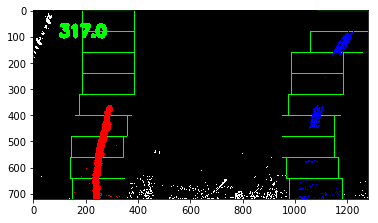

In [83]:
import copy

def peaks_detect(histogram):
    midpoint = np.int(histogram.shape[0]/2)
    left_peak = np.argmax(histogram[:midpoint])
    right_peak = np.argmax(histogram[midpoint:]) + midpoint
    
    return (left_peak, right_peak)

def detect_lanes(img):

    #plt.imshow(img)
    #plt.title('before')
    #plt.show()
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    binary_warped = pipeline(img)
    
    #plt.imshow(binary_warped)
    #plt.title('binary')
    #plt.show()
    
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    #plt.imshow(out_img)
    #plt.title('before')
    #plt.show()
    
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    peaks = peaks_detect(histogram)
    leftx_base = peaks[0]
    rightx_base = peaks[1]

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):

        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Draw the windows on the visualization image
        #plt.imshow(out_img)
        #plt.show()
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        #plt.imshow(out_img)
        #plt.show()
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        #plt.imshow(out_img)
        #plt.show()

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    #print(leftx)

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    #print(left_curverad, right_curverad)
    # Example values: 1926.74 1908.48

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    #print(ploty*ym_per_pix)
    #print((leftx*xm_per_pix)[150])
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad1 = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad1 = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    avg_curve = str((left_curverad1+right_curverad1)//2)
    cv2.putText(out_img,avg_curve, (100,100), cv2.FONT_HERSHEY_SIMPLEX, 2, (0,255,0), cv2.LINE_AA )
    
    return out_img, ploty, left_fitx, right_fitx, left_curverad, right_curverad, left_curverad1, right_curverad1

lanes, ploty, left_fitx, right_fitx, left_curverad, right_curverad, left_curverad1, right_curverad1 = detect_lanes(bird_eye[2])
plt.imshow(lanes)

print(right_curverad)
print(left_curverad)
print(right_curverad1)
print(left_curverad1)

def draw_line(point_lists):
    width, height = 640, 480  # picture's size
    img = np.zeros((height, width, 3), np.uint8) + 255 # make the background white
    line_width = 1
    for line in point_lists:
        color = (123,123,123) # change color or make a color generator for your self
        pts = np.array(line, dtype=np.int32)
        cv2.polylines(img, [pts], False, color, thickness=line_width, lineType=cv2.CV_AA)
    cv2.imshow("Art", img)
    cv2.waitKey(0)    # miliseconds, 0 means wait forever
    
    
    #ax[img_counter,3].plot(left_fitx, ploty, color='yellow')
    #ax[img_counter,3].plot(right_fitx, ploty, color='yellow')

calc1: 8960.03210223 m 5191.75147188 m
calcCorrected: 2896.9290412 m 1687.08698379 m
calc1: 22194.4240545 m 15144.0876059 m
calcCorrected: 7259.73312805 m 4926.71904669 m
calc1: 1027.45863392 m 928.494338212 m
calcCorrected: 337.353941488 m 297.516153052 m
calc1: 1180.07665444 m 802.866067593 m
calcCorrected: 384.450674555 m 245.115299992 m
calc1: 2674.20242046 m 1436.76014549 m
calcCorrected: 799.576528012 m 464.807435601 m
calc1: 1607.07274883 m 897.951499208 m
calcCorrected: 527.807315787 m 288.84039994 m
calc1: 1025.93433764 m 1577.95275272 m
calcCorrected: 331.267600437 m 447.513413717 m
calc1: 2755.72378533 m 3934.54011614 m
calcCorrected: 803.401781758 m 1203.53334341 m


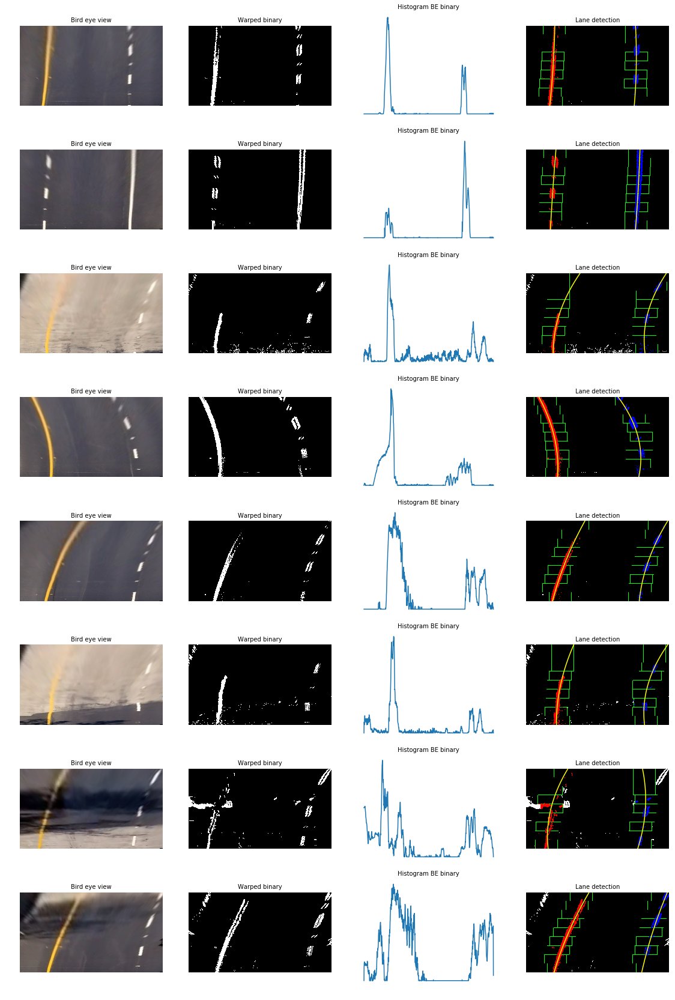

In [67]:
fig, ax = plt.subplots(len(bird_eye), 4, figsize=(15, 25))
fig.tight_layout()

img_counter = 0
for img in bird_eye:
    ax[img_counter,0].imshow(img)
    ax[img_counter,0].set_title('Bird eye view', fontsize=10)
    ax[img_counter,0].axis('off')
    
    binary_img = pipeline(img)
    ax[img_counter,1].imshow(binary_img, cmap='gray')
    ax[img_counter,1].set_title('Warped binary', fontsize=10)
    ax[img_counter,1].axis('off')
    
    histogram = np.sum(binary_img, axis=0)
    ax[img_counter,2].plot(histogram)
    ax[img_counter,2].set_title('Histogram BE binary', fontsize=10)
    ax[img_counter,2].axis('off')
    
    img_cp = copy.copy(img)
    lanes, ploty, left_fitx, right_fitx, left_curverad, right_curverad, left_curverad1, right_curverad1 = detect_lanes(img_cp)
    ax[img_counter,3].imshow(lanes)
    ax[img_counter,3].plot(left_fitx, ploty, color='yellow')
    ax[img_counter,3].plot(right_fitx, ploty, color='yellow')
    ax[img_counter,3].set_title('Lane detection', fontsize=10)
    ax[img_counter,3].axis('off')
    
    print('calc1:',left_curverad, 'm', right_curverad, 'm')
    print('calcCorrected:',left_curverad1, 'm', right_curverad1, 'm')
    
    img_counter += 1
    
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

1809.75201097 1501.09825389
593.780393307 m 492.541754107 m


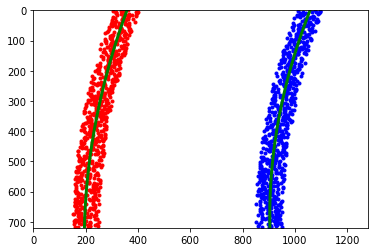

In [72]:

# Generate some fake data to represent lane-line pixels
ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
# For each y position generate random x position within +/-50 pix
# of the line base position in each case (x=200 for left, and x=900 for right)
leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                              for y in ploty])
rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                for y in ploty])

leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
rightx = rightx[::-1]  # Reverse to match top-to-bottom in y


# Fit a second order polynomial to pixel positions in each fake lane line
left_fit = np.polyfit(ploty, leftx, 2)
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fit = np.polyfit(ploty, rightx, 2)
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Plot up the fake data
mark_size = 3
plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
plt.xlim(0, 1280)
plt.ylim(0, 720)
plt.plot(left_fitx, ploty, color='green', linewidth=3)
plt.plot(right_fitx, ploty, color='green', linewidth=3)
plt.gca().invert_yaxis() # to visualize as we do the images

# Define y-value where we want radius of curvature
# I'll choose the maximum y-value, corresponding to the bottom of the image
y_eval = np.max(ploty)
left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
print(left_curverad, right_curverad)
# Example values: 1926.74 1908.48

# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm')
# Example values: 632.1 m    626.2 m